<a href="https://colab.research.google.com/github/EWECORP/DScience_41870/blob/main/Primera_Entrega_Eduardo_Ettlin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

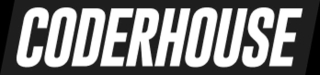

# **CURSO DE DATA SCIENCE**
##**DATA STORY TELLING**
## **PRIMERA ENTREGA**

*AUTOR:Eduardo ETTLIN

Accidentes en EE. UU. (2016 - 2021)
Un conjunto de datos de accidentes de tráfico en todo el país (2016 - 2021)


**Acerca del conjunto de datos**

*Descripción*

Este es un conjunto de datos de accidentes automovilísticos de todo el país, que cubre 49 estados de los EE. UU. Los datos de accidentes se recopilan desde febrero de 2016 hasta diciembre de 2021, utilizando múltiples API que proporcionan transmisión de datos de incidentes (o eventos) de tráfico. Estas API transmiten datos de tráfico capturados por una variedad de entidades, como los departamentos de transporte estatales y de EE. UU., agencias de aplicación de la ley, cámaras de tráfico y sensores de tráfico dentro de las redes de carreteras. Actualmente, hay alrededor de 2,8 millones de registros de accidentes en este conjunto de datos.
"Se entrega el siguiente set de datos con nombre “US_Accidents_Dec21_updated.csv”.

**Contenido**

Este conjunto de datos se ha recopilado en tiempo real mediante varias API de tráfico. Actualmente, contiene datos de accidentes recopilados desde febrero de 2016 hasta diciembre de 2021 para los Estados Unidos contiguos.

**Inspiración**

US-Accidentes” se puede utilizar para numerosas aplicaciones, como la predicción de accidentes automovilísticos en tiempo real, el estudio de ubicaciones de puntos críticos de accidentes automovilísticos, el análisis de víctimas y la extracción de reglas de causa y efecto para predecir accidentes automovilísticos, y el estudio del impacto de la precipitación u otros estímulos ambientales en la ocurrencia de accidentes. La publicación más reciente del conjunto de datos también puede ser útil para estudiar el impacto de COVID-19 en el comportamiento del tráfico y los accidentes.

**Cobertura**

El conjunto de datos cubre 49 estados de los EE. UU. El siguiente diagrama muestra la distribución actual de datos en todos los estados.

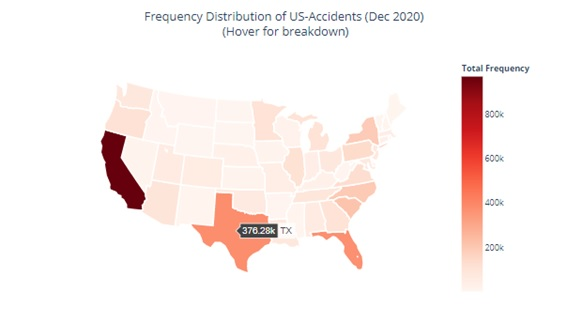

#**Introducción**

**Contexto empresarial.**

Estados Unidos ha experimentado un aumento en el número de accidentes en las carreteras. Quieren saber si el número de accidentes ha aumentado en las últimos meses. Para todos los accidentes reportados, han recopilado detalles para cada accidente y han estado manteniendo registros durante los últimos 5 años(desde 2016 hasta 2021).

El cliente nos ha contratado para que construyas visualizaciones que les ayuden a identificar patrones en accidentes, lo que les ayudaría a tomar acciones preventivas para reducir la cantidad de accidentes en el futuro. Tienen ciertos parámetros como geologalización, hora del día, condiciones climáticas, gravedad del accidente, etc. De los que se preocupan y de los que les gustaría obtener información específica.

**Problema comercial.**

Nuestra tarea es formatear los datos proporcionados y proporcionar visualizaciones que respondan las preguntas específicas que tiene el cliente, que se mencionan a continuación.

**Contexto analítico.**

 Se le proporciona un archivo CSV (almacenado en la carpeta datos ya creada) que contiene detalles sobre cada accidente, como fecha, hora, ubicación del accidente, gravedad del accidente,etc. El delimitador en el archivo CSV dado es el signo (;) en lugar del predeterminado (,). Realizará las siguientes tareas con los datos:

Extraiga datos adicionales compementarios

Leer, transformar y preparar datos para su visualización

Realizar análisis y construir visualizaciones de los datos para identificar patrones en el conjunto de datos.

El cliente tiene un conjunto específico de preguntas a las que le gustaría obtener respuestas. Deberá proporcionar visualizaciones para acompañar estos:

1- ¿Cómo ha fluctuado el número de accidentes durante el último año y medio? ¿Han aumentado con el tiempo?.

2- Para un día en particular, ¿durante qué horas es más probable que ocurran accidentes?.

3- ¿Hay más accidentes entre semana que durante los fines de semana?.

4- ¿Cuál es la proporción de recuento de accidentes por estado o cuidad?

5- ¿Qué distritos tienen un número desproporcionadamente grande de accidentes para su tamaño?

6- Para cada municipio, ¿durante qué horas es más probable que ocurran accidentes?

In [1]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip -q #quiet mode

     - 22.6 MB 23.7 MB/s 0:00:02
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 771.2 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 24.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 29.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 68.9 MB/s eta 0:00:00


In [2]:
#Conectamos mi drive
from google.colab import drive
#Importamos OS
import os
#Montamos drive
drive.mount('/content/gdrive', force_remount=True)
# Establecer ruta de acceso en drive
import os
print(os.getcwd())


Mounted at /content/gdrive
/content


In [3]:
#Importamos las librerias

# Operaciones Basicas
import numpy as np
import pandas as pd
#import pandas_profilingn # `import pandas_profiling` is going to be deprecated by April 1st.
import ydata_profiling
# Visualizacion de Datos
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
from ydata_profiling.utils.cache import cache_file


In [43]:
# Me muevo a la carpeta
os.chdir("/content/gdrive/MyDrive/DScience_41870")
print(os.getcwd())

#Lectura del dataframe
datos=pd.read_csv('/content/gdrive/MyDrive/DScience_41870/US_Accidents_Dec21_updated.csv',sep=',',nrows=2900000 )  # nrows: 1500000  # Disminuir Tamaño a 1.5 MM (Riginalmente Tiene 2.845.342 registros)
datos.head()


/content/gdrive/MyDrive/DScience_41870


,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.865420,-84.062800,39.865010,-84.048730,0.747,At OH-4/OH-235/Exit 41 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Night
2,A-3,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.102660,-84.524680,39.102090,-84.523960,0.055,At I-71/US-50/Exit 1 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Day
3,A-4,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.062130,-81.537840,41.062170,-81.535470,0.123,At Dart Ave/Exit 21 - Accident.,...,False,False,False,False,False,False,Night,Night,Day,Day
4,A-5,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day


In [44]:
#Veamos el shape
datos.shape

(2845342, 47)

In [45]:
#Tipo de estructura del dataset
type(datos)

pandas.core.frame.DataFrame

# DATOS
## Detalle explicativo de los campos

In [46]:
d_desc = {'ID':'Este es un identificador único del registro de accidentes. ' ,
'Severity':'Muestra la gravedad del accidente, un número entre 1 y 4, donde 1 indica el menor impacto en el tráfico (es decir, breve retraso como resultado del accidente) y 4 indica un impacto significativo en el tráfico (es decir, mucho retraso). ' ,
'Start_Time':'Muestra la hora de inicio del accidente en la zona horaria local. ' ,
'End_Time':'Muestra la hora de finalización del accidente en la zona horaria local. La hora de finalización aquí se refiere a cuándo se descartó el impacto del accidente en el flujo de tráfico. ' ,
'Start_Lat':'Muestra la latitud en coordenadas GPS del punto de inicio. ' ,
'Start_Lng':'Muestra la longitud en coordenadas GPS del punto de inicio. ' ,
'End_Lat':'Muestra la latitud en coordenadas GPS del punto final. ' ,
'End_Lng':'Muestra la longitud en coordenadas GPS del punto final. ' ,
'Distance(mi)':'La longitud de la extensión de la carretera afectada por el accidente. ' ,
'Description':'Muestra la descripción del accidente en lenguaje natural. ' ,
'Number':'Muestra el número de calle en el campo de dirección. ' ,
'Street':'Muestra el nombre de la calle en el campo de dirección. ' ,
'Side':'Muestra el lado relativo de la calle (Derecha/Izquierda) en el campo de dirección. ' ,
'City':'Muestra la ciudad en el campo de dirección. ' ,
'County':'Muestra el condado en el campo de dirección. ' ,
'State':'Muestra el estado en el campo de dirección. ' ,
'Zipcode':'Muestra el código postal en el campo de dirección. ' ,
'Country':'Muestra el país en el campo de dirección. ' ,
'Timezone':'Muestra la zona horaria según la ubicación del accidente (este, centro, etc.). ' ,
'Airport_Code':'Indica una estación meteorológica en el aeropuerto que es la más cercana al lugar del accidente. ' ,
'Weather_Timestamp':'Muestra la marca de tiempo del registro de observación meteorológica (en hora local). ' ,
'Temperature(F)':'Muestra la temperatura (en Fahrenheit). ' ,
'Wind_Chill(F)':'Muestra la sensación térmica (en Fahrenheit). ' ,
'Humidity(%)':'Muestra la humedad (en porcentaje). ' ,
'Pressure(in)':'Muestra la presión del aire (en pulgadas). ' ,
'Visibility(mi)':'Muestra la visibilidad (en millas). ' ,
'Wind_Direction':'Muestra la dirección del viento. ' ,
'Wind_Speed(mph)':'Muestra la velocidad del viento (en millas por hora). ' ,
'Precipitation(in)':'Muestra la cantidad de precipitación en pulgadas, si hay alguna. ' ,
'Weather_Condition':'Muestra las condiciones meteorológicas (lluvia, nieve, tormenta, niebla, etc.) ' ,
'Amenity':'Una anotación de PDI que indica la presencia de un servicio en un lugar cercano. ' ,
'Bump':'Una anotación de PDI que indica la presencia de badenes o jorobas en un lugar cercano. ' ,
'Crossing':'Una anotación de PDI que indica la presencia de un cruce en una ubicación cercana. ' ,
'Give_Way':'Una anotación de PDI que indica la presencia de un CEDA EL PASO una ubicación cercana. ' ,
'Junction':'Una anotación de PDI que indica la presencia de un cruce en una ubicación cercana. ' ,
'No_Exit':'Una anotación de PDI que indica la presencia de SIN SALIDA en una ubicación cercana. ' ,
'Railway':'Una anotación de PDI que indica la presencia de vías férreas en un lugar cercano. ' ,
'Roundabout':'Una anotación de PDI que indica la presencia de una rotonda en una ubicación cercana. ' ,
'Station':'Una anotación de PDI que indica la presencia de una estación en una ubicación cercana. ' ,
'Stop':'Una anotación de PDI que indica la presencia de una parada en una ubicación cercana. ' ,
'Traffic_Calming':'Una anotación de PDI que indica la presencia de REDUCTORES de VELOCIDAD en una ubicación cercana. ' ,
'Traffic_Signal':'Una anotación de PDI que indica la presencia de SEÑAL de TRAFICO en una ubicación cercana. ' ,
'Turning_Loop':'Una anotación de PDI que indica la presencia de VUELTA en U permitida en una ubicación cercana. ' ,
'Sunrise_Sunset':'Muestra el período del día (es decir, día o noche) en función del amanecer/atardecer. ' ,
'Civil_Twilight':'Muestra el período del día (es decir, día o noche) basado en el crepúsculo civil . ' ,
'Nautical_Twilight':'Muestra el período del día (es decir, día o noche) basado en el crepúsculo náutico . ' ,
'Astronomical_Twilight':'Muestra el período del día (es decir, día o noche) basado en el crepúsculo astronómico . '
}

## GRAFICOS EXPLORATORIOS

In [48]:
#Autolabel
def autolabel(datos,rotacion):
    for dato in datos:
      height = dato.get_height()
      ax1.annotate('{}'.format(height),
                   xy=(dato.get_x()+dato.get_width()/2,height),
                   xytext=(0,1),
                   textcoords="offset points",
                   ha='center',va='bottom',rotation=rotacion
                   )

In [49]:
# Creación colores aleatorios
import random

def color_aleatorio():
  r, g, b = random.randint(0,255), random.randint(0,255), random.randint(0,255)
  return "#{:02x}{:02x}{:02x}".format(r,g,b)

color = [color_aleatorio() for _ in range(100)]

In [50]:
#Defino los valores para los ejes (X,Y)
Severity_cantidad = datos.groupby('Severity')['Severity'].agg(len)
Severity_tipos = list(datos['Severity'].value_counts().index)

State_cantidad = datos.groupby('State')['State'].agg(len)
State_tipos =list(datos['State'].value_counts().index)

County_cantidad = datos.groupby('County')['County'].agg(len)
County_tipos =list(datos['County'].value_counts().index)

In [51]:
plt.style.use("seaborn-v0_8-bright")  # classic

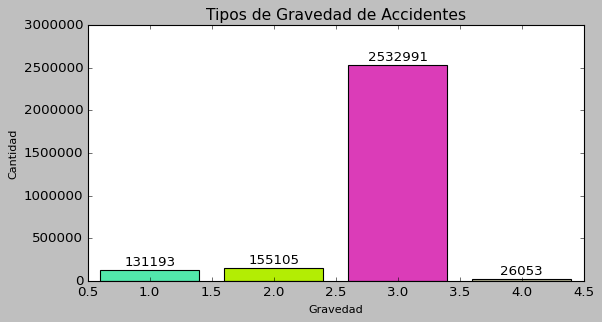

In [52]:
fig, ax1 = plt.subplots(figsize=(8,4))
graf = ax1.bar(sorted(Severity_tipos, reverse = True), Severity_cantidad, color = color)
ax1.set_ylim([0,3000000])
ax1.set_title('Tipos de Gravedad de Accidentes', fontsize= '14')
ax1.set_ylabel('Cantidad', fontsize= '10')
ax1.set_xlabel('Gravedad',fontsize= '10')
autolabel(graf, 0)
plt.show()

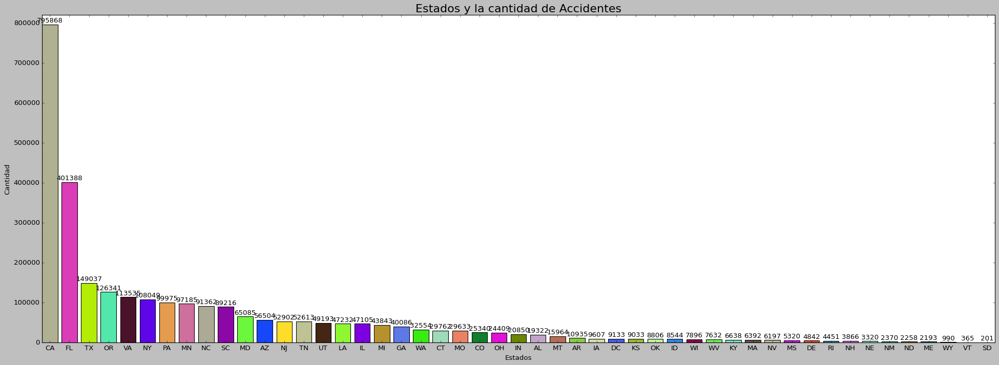

In [53]:
fig, ax1 = plt.subplots(figsize=(30,10))
graf = ax1.bar((State_tipos), sorted(State_cantidad, reverse=True), color = color )
ax1.set_ylim([0,820000])
ax1.set_title('Estados y la cantidad de Accidentes', fontsize= '20')
ax1.set_ylabel('Cantidad', fontsize= '12')
ax1.set_xlabel('Estados',fontsize= '12')
autolabel(graf,0)
plt.show()

## Pregunta de Interés
¿Influyen las Condiciones Climáticas en la Cantidad de Accidentes?

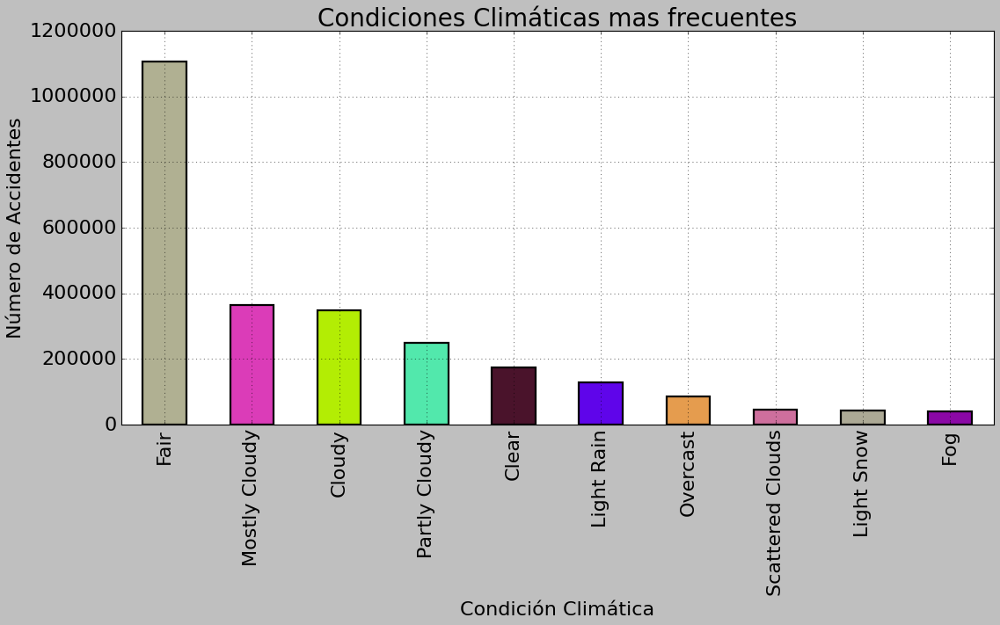

In [54]:
fig, ax=plt.subplots(figsize=(16,7))
datos['Weather_Condition'].value_counts().sort_values(ascending=False).head(10).plot.bar(width=0.5,edgecolor='k',align='center',linewidth=2, color = color)
plt.xlabel('Condición Climática',fontsize=20)
plt.ylabel('Número de Accidentes',fontsize=20)
ax.tick_params(labelsize=20)
plt.title('Condiciones Climáticas mas frecuentes',fontsize=25)
plt.grid()
plt.ioff()
plt.show()

## Enriquecer el Modelo
Con variables derivadas de las existentes


In [55]:
datos['Hora'] = pd.to_datetime( datos['Start_Time'],format='%Y-%m-%d %H:%M:%S').dt.hour  # Extraer la HORA del Día en la

In [56]:
datos['Anio_Mes'] =  pd.to_datetime( datos['Start_Time'],format='%Y-%m-%d %H:%M:%S').dt.strftime('%Y-%m')  # Extraer AÑO y MES


In [57]:
datos['day_of_week'] = pd.to_datetime( datos['Start_Time'],format='%Y-%m-%d %H:%M:%S').dt.dayofweek  # Dia de la Semana

days = {0:'Lunes',1:'Martes',2:'Miércoeles',3:'Jueves',4:'Viernes',5:'Sabado',6:'Domingo'}
datos['day_of_week'] = datos['day_of_week'].apply(lambda x: days[x])

In [58]:
datos.head()

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Hora,Anio_Mes,day_of_week
0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,...,False,False,False,Night,Night,Night,Night,0,2016-02,Lunes
1,A-2,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.865420,-84.062800,39.865010,-84.048730,0.747,At OH-4/OH-235/Exit 41 - Accident.,...,False,False,False,Night,Night,Night,Night,5,2016-02,Lunes
2,A-3,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.102660,-84.524680,39.102090,-84.523960,0.055,At I-71/US-50/Exit 1 - Accident.,...,False,False,False,Night,Night,Night,Day,6,2016-02,Lunes
3,A-4,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.062130,-81.537840,41.062170,-81.535470,0.123,At Dart Ave/Exit 21 - Accident.,...,False,False,False,Night,Night,Day,Day,6,2016-02,Lunes
4,A-5,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,...,False,False,False,Day,Day,Day,Day,7,2016-02,Lunes


## Pregunta de Interes
¿Influye el día de la Semana en la cantidad y Severidad de Accidentes?

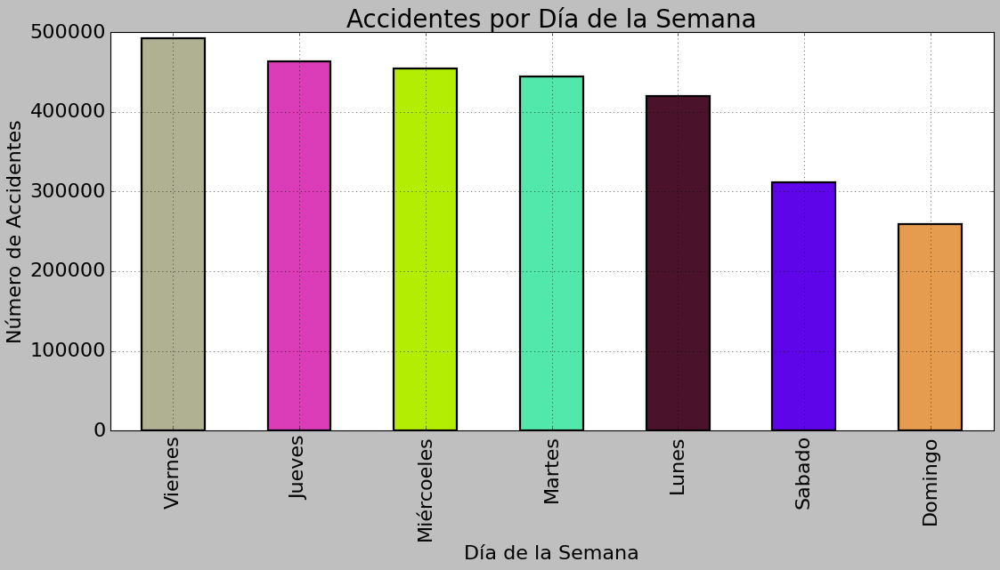

In [59]:
fig, ax=plt.subplots(figsize=(16,7))
datos['day_of_week'].value_counts().sort_values(ascending=False).head(7).plot.bar(width=0.5,edgecolor='k',align='center',linewidth=2, color = color)
plt.xlabel('Día de la Semana',fontsize=20)
plt.ylabel('Número de Accidentes',fontsize=20)
ax.tick_params(labelsize=20)
plt.title('Accidentes por Día de la Semana',fontsize=25)
plt.grid()
plt.ioff()
plt.show()

## ¿Influye la Hora del Día ?

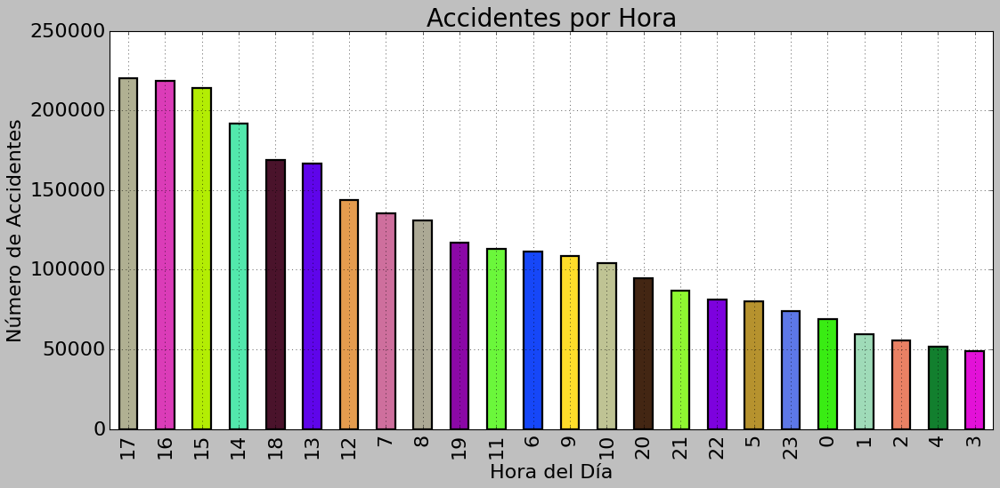

In [60]:
fig, ax=plt.subplots(figsize=(16,7))
datos['Hora'].value_counts().sort_values(ascending=False).head(24).plot.bar(width=0.5,edgecolor='k',align='center',linewidth=2, color = color)
plt.xlabel('Hora del Día',fontsize=20)
plt.ylabel('Número de Accidentes',fontsize=20)
ax.tick_params(labelsize=20)
plt.title('Accidentes por Hora',fontsize=25)
plt.grid()
plt.ioff()
plt.show()

# Procesamiento y Selección de variables
Elimino algunas columnas para alivianar del dataset

In [61]:
# Trato de evitar el uso excesivo de memoria y borro algunas columnas
#col_del = [ 'Number', 'Start_Lat', 'Start_Lng','End_Lat', 'End_Lng','Zipcode', 'Country', 'Timezone', 'Airport_Code'] # Columnas a borrar que no aportan

In [11]:
# Borrar variables
#datos=datos.drop(labels=col_del, axis=1) # Borrando las columnas en col_del
datos.columns # Verificando las columnas que quedaron

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Number', 'Street',
       'Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

## Valores Duplicados


In [62]:
datos.drop_duplicates(inplace=True) #datos = df_num.drop_duplicates()

In [63]:
#Totalidad de registros por columnas
datos.count()

ID                       2845342
Severity                 2845342
Start_Time               2845342
End_Time                 2845342
Start_Lat                2845342
Start_Lng                2845342
End_Lat                  2845342
End_Lng                  2845342
Distance(mi)             2845342
Description              2845342
Number                   1101431
Street                   2845340
Side                     2845342
City                     2845205
County                   2845342
State                    2845342
Zipcode                  2844023
Country                  2845342
Timezone                 2841683
Airport_Code             2835793
Weather_Timestamp        2794606
Temperature(F)           2776068
Wind_Chill(F)            2375699
Humidity(%)              2772250
Pressure(in)             2786142
Visibility(mi)           2774796
Wind_Direction           2771567
Wind_Speed(mph)          2687398
Precipitation(in)        2295884
Weather_Condition        2774706
Amenity   

In [64]:
#Tipo de dato de cada columna
datos.dtypes

ID                        object
Severity                   int64
Start_Time                object
End_Time                  object
Start_Lat                float64
Start_Lng                float64
End_Lat                  float64
End_Lng                  float64
Distance(mi)             float64
Description               object
Number                   float64
Street                    object
Side                      object
City                      object
County                    object
State                     object
Zipcode                   object
Country                   object
Timezone                  object
Airport_Code              object
Weather_Timestamp         object
Temperature(F)           float64
Wind_Chill(F)            float64
Humidity(%)              float64
Pressure(in)             float64
Visibility(mi)           float64
Wind_Direction            object
Wind_Speed(mph)          float64
Precipitation(in)        float64
Weather_Condition         object
Amenity   

In [65]:
#Principales medidas estadisticas
datos.describe().T

,count,mean,std,min,25%,50%,75%,max
Severity,2845342.0,2.137572,0.478722,1.000000,2.000000,2.000000,2.000000,4.000000e+00
Start_Lat,2845342.0,36.245201,5.363797,24.566027,33.445174,36.098609,40.160243,4.900058e+01
Start_Lng,2845342.0,-97.114633,18.317819,-124.548074,-118.033113,-92.418076,-80.372431,-6.711317e+01
End_Lat,2845342.0,36.245321,5.363873,24.566013,33.446278,36.097987,40.161049,4.907500e+01
End_Lng,2845342.0,-97.114387,18.317632,-124.545748,-118.033331,-92.417718,-80.373383,-6.710924e+01
Distance(mi),2845342.0,0.702678,1.560361,0.000000,0.052000,0.244000,0.764000,1.551860e+02
Number,1101431.0,8089.408114,18360.093995,0.000000,1270.000000,4007.000000,9567.000000,9.999997e+06
Temperature(F),2776068.0,61.793556,18.622629,-89.000000,50.000000,64.000000,76.000000,1.960000e+02
Wind_Chill(F),2375699.0,59.658231,21.160967,-89.000000,46.000000,63.000000,76.000000,1.960000e+02
Humidity(%),2772250.0,64.365452,22.874568,1.000000,48.000000,67.000000,83.000000,1.000000e+02


## VARIABLES con OUTLIERS

En el caso de los árboles de decisión sabemos que son robustos ante outliers, pero como queremos a futuro aplicar más métodos haremos igual el análisis de valores extremos:

Severity Muestra la gravedad del accidente, un número entre 1 y 4, donde 1 indica el menor impacto en el tráfico (es decir, breve retraso como resultado del accidente) y 4 indica un impacto significativo en el tráfico (es decir, mucho retraso). 


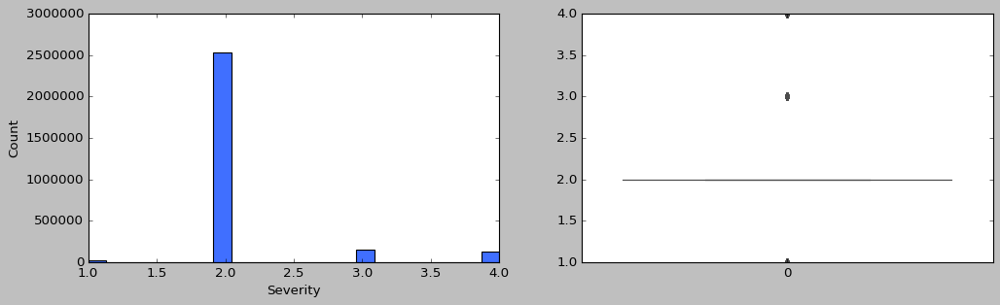

Temperature(F) Muestra la temperatura (en Fahrenheit). 


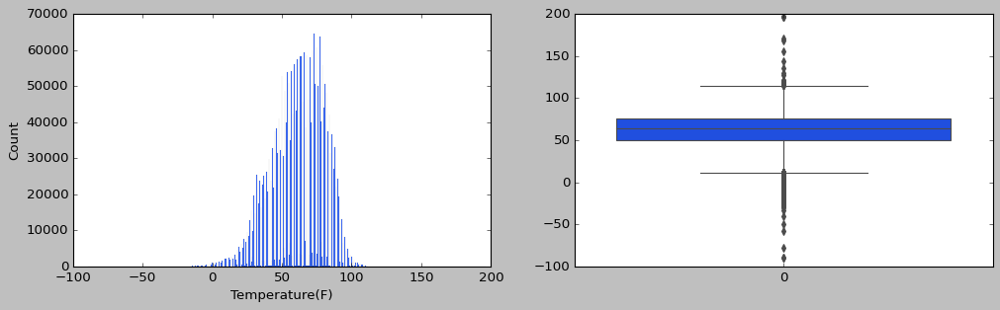

Precipitation(in) Muestra la cantidad de precipitación en pulgadas, si hay alguna. 


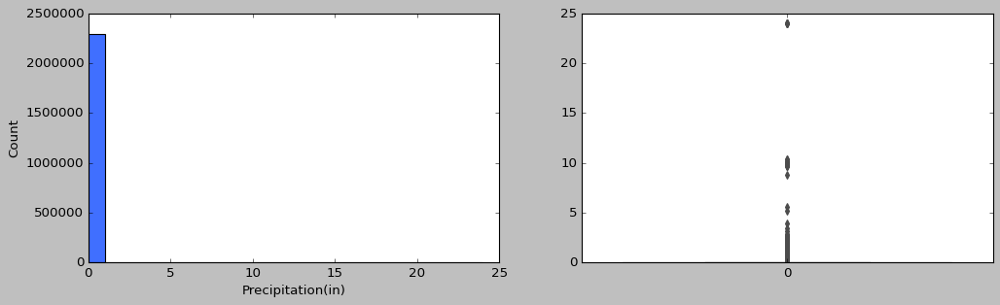

Visibility(mi) Muestra la visibilidad (en millas). 


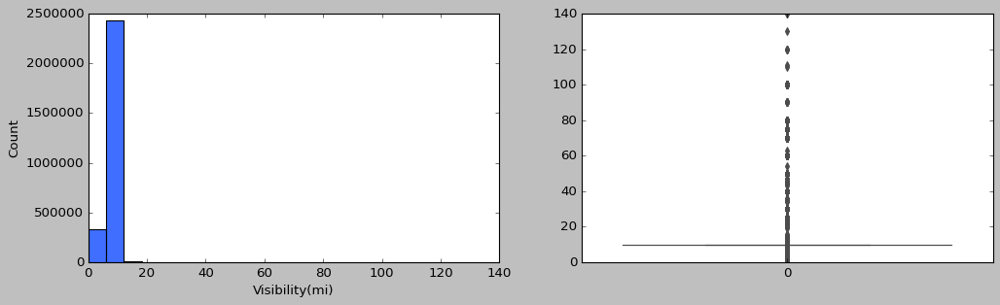

In [69]:
for col in ['Severity', 'Temperature(F)', 'Precipitation(in)', 'Visibility(mi)']:
    print ( col, d_desc[col])
    fig, ax = plt.subplots(1,2, figsize=(15, 4))
    ax[0] = sns.histplot(datos[col], ax=ax[0])
    ax[1] = sns.boxplot(datos[col], ax=ax[1])
    plt.show()

Antes de elegir si hacemos algún tipo de transformación debemos analizar la relación de los valores outliers con el target.



Severity Muestra la gravedad del accidente, un número entre 1 y 4, donde 1 indica el menor impacto en el tráfico (es decir, breve retraso como resultado del accidente) y 4 indica un impacto significativo en el tráfico (es decir, mucho retraso). 


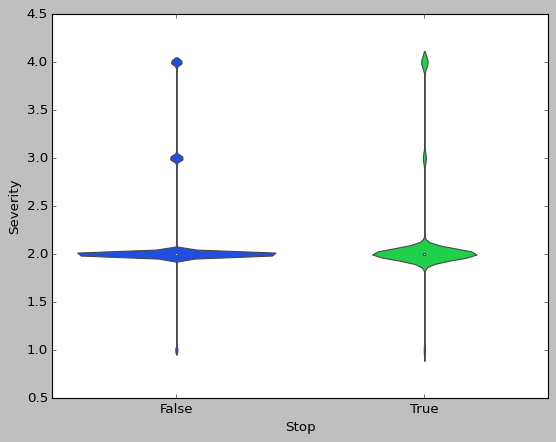

Temperature(F) Muestra la temperatura (en Fahrenheit). 


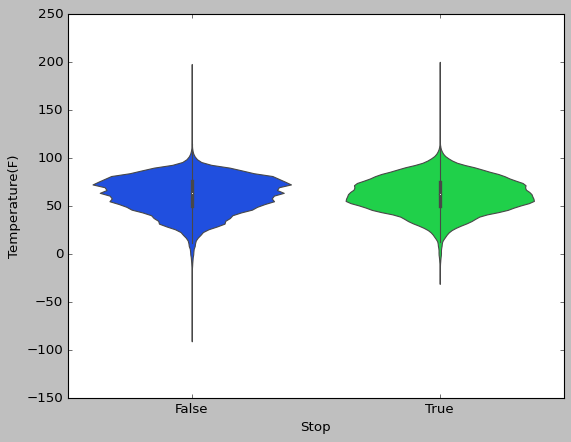

Precipitation(in) Muestra la cantidad de precipitación en pulgadas, si hay alguna. 


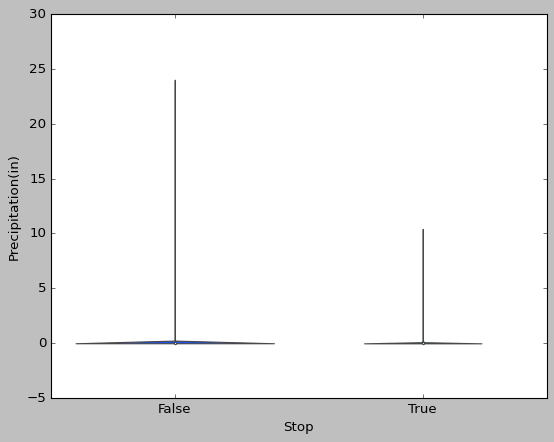

Visibility(mi) Muestra la visibilidad (en millas). 


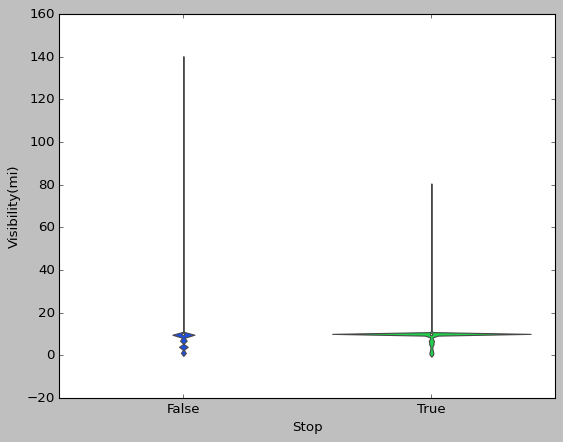

In [70]:
for col in ['Severity', 'Temperature(F)', 'Precipitation(in)', 'Visibility(mi)']:
    print(col, d_desc[col])
    sns.violinplot(x='Stop', y=col, data=datos)
    plt.show()

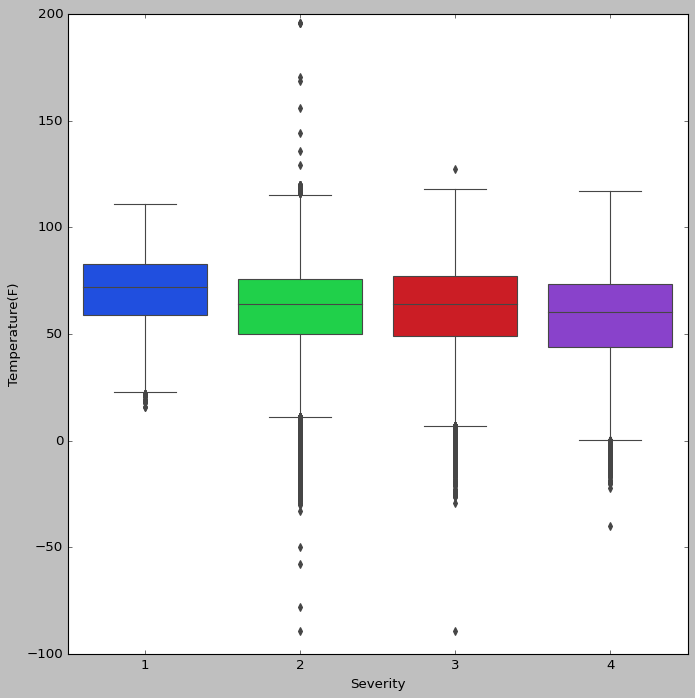

In [71]:
#Boxplot
plt.figure(figsize=(10,10)) #defino el tamaño del grafico
sns.boxplot(y = 'Temperature(F)', x = 'Severity', data = datos)
plt.show()

### Exploración del Perfil del Dataset

In [ ]:
#Data Profiling
profile = ydata_profiling.ProfileReport(datos)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<ipython-input-74-14ccbcfcdc00>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(datos.corr(), annot = True, cmap = 'Wistia')


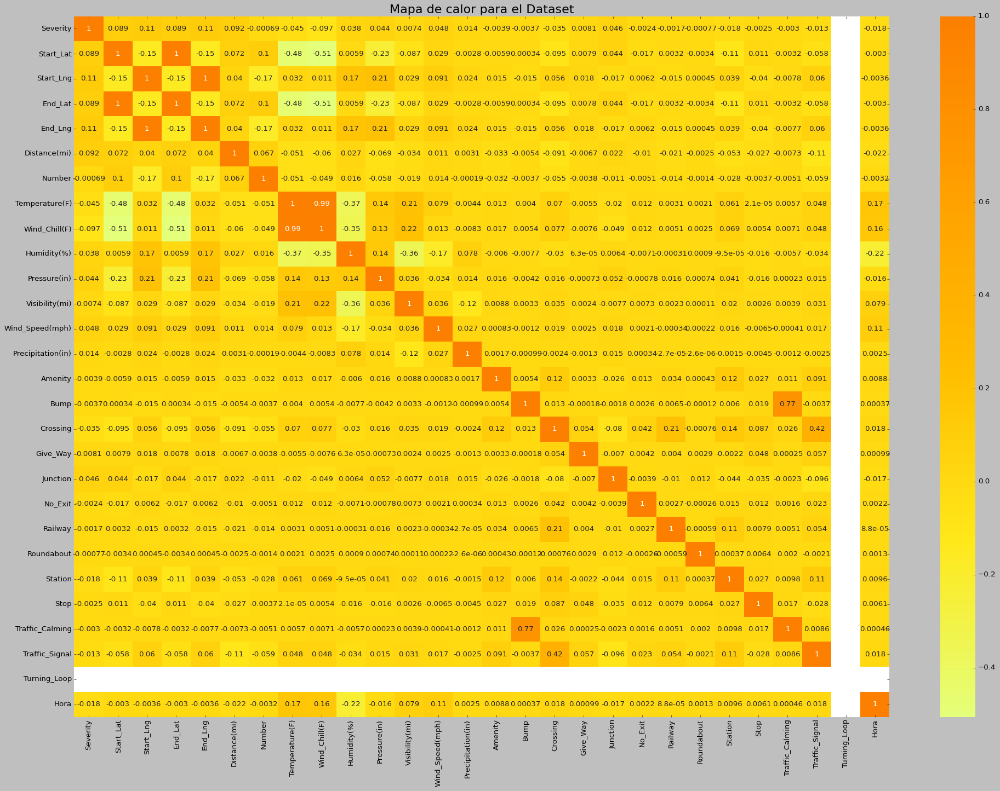

In [74]:
#Hagamos un HeatMap del df

plt.rcParams['figure.figsize'] = (30, 20)

sns.heatmap(datos.corr(), annot = True, cmap = 'Wistia')
plt.title('Mapa de calor para el Dataset', fontsize = 20)
plt.show()

In [77]:
#Ejemplo: Categórica vs. categórica
pd.crosstab(datos.Severity,datos['Pressure(in)'])

Pressure(in),0.00,0.02,0.30,2.99,3.04,16.72,19.21,19.24,19.37,19.48,...,32.87,38.94,52.76,56.31,56.54,57.74,58.04,58.13,58.16,58.90
Severity,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,1,1,2,2,2,2,2,1,1,...,1,3,2,1,1,1,2,1,2,1
3,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [78]:
pd.crosstab(datos.Severity, datos['Pressure(in)'], normalize=True) #Agregamos los valores en relativo

Pressure(in),0.00,0.02,0.30,2.99,3.04,16.72,19.21,19.24,19.37,19.48,...,32.87,38.94,52.76,56.31,56.54,57.74,58.04,58.13,58.16,58.90
Severity,,,,,,,,,,,,,,,,,,,,,
1,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2,0.000000e+00,3.589193e-07,3.589193e-07,7.178385e-07,7.178385e-07,7.178385e-07,7.178385e-07,7.178385e-07,3.589193e-07,3.589193e-07,...,3.589193e-07,0.000001,7.178385e-07,3.589193e-07,3.589193e-07,3.589193e-07,7.178385e-07,3.589193e-07,7.178385e-07,3.589193e-07
3,3.589193e-07,0.000000e+00,3.589193e-07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
4,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00


In [79]:
datos.groupby('Severity')['Pressure(in)'].mean()

Severity
1    29.014460
2    29.463911
3    29.578031
4    29.602213
Name: Pressure(in), dtype: float64

In [80]:
#Scatterplot
datos.plot.scatter(x='Severity', y='Pressure(in)')

<Axes: xlabel='Severity', ylabel='Pressure(in)'>

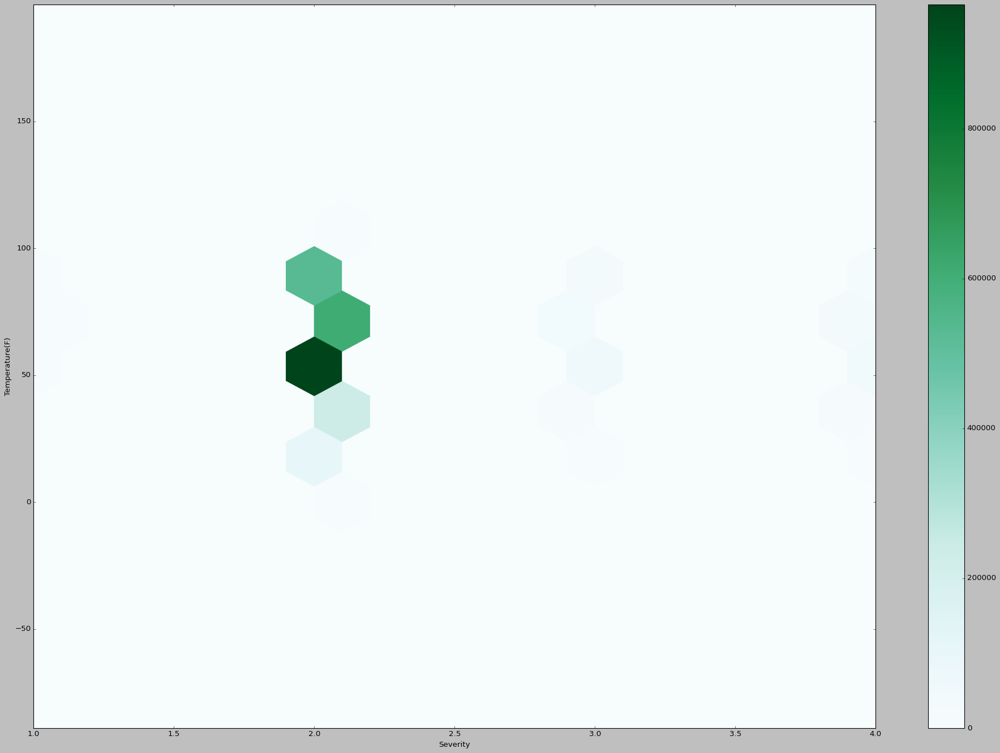

In [91]:
datos.plot.hexbin(x='Severity', y='Temperature(F)', gridsize=15)
plt.show()

Como conclusión rápida podemos observar que a medida que sube la temperatura(F) aumentan los accidentes con la gravedad del tipo 2.

# Recuento de Accidentes en AUTOPISTAS (Street)

Se puede observar que la mayoría de los accidente ocurren en las autopistas la sigla I-xxx significa ruta Interestatal y el sentido . Norte o Sur.

In [89]:
# crear un dataframe con Street y la cantidad de accidentes
street_df = pd.DataFrame( datos['Street'].value_counts()).reset_index().rename(columns={'index':'Street No.', 'Street':'Cases'})


In [82]:
top_ten_streets_df = pd.DataFrame(street_df.head(10))
top_ten_streets_df

,Street No.,Cases
0,I-95 N,39853
1,I-5 N,39402
2,I-95 S,36425
3,I-5 S,30229
4,I-10 E,26164
5,I-10 W,25298
6,I-80 W,17545
7,I-80 E,16873
8,I-405 N,13708
9,I-15 N,12675


In [84]:
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.patches as mpatches

<ipython-input-90-80b96616dcb0>:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('gnuplot2', 10)


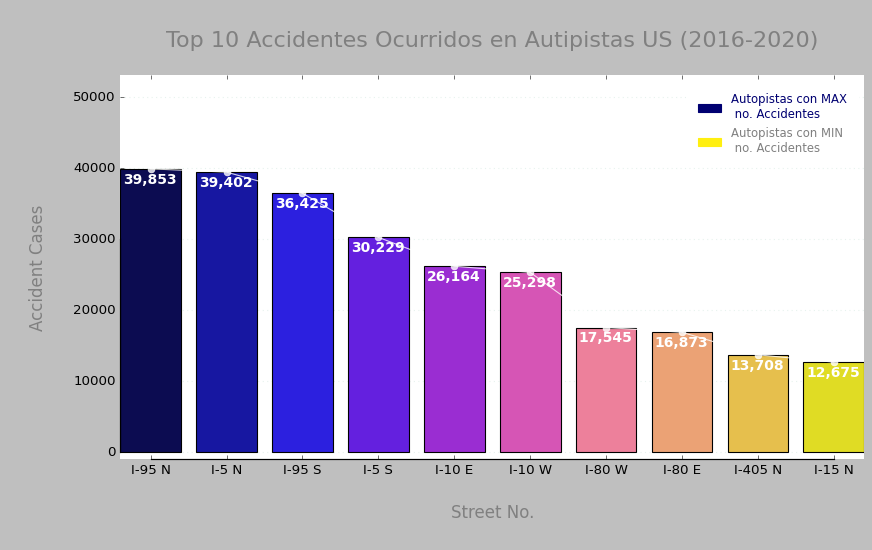

In [90]:
fig, ax = plt.subplots(figsize = (12,6), dpi = 80)

cmap = cm.get_cmap('gnuplot2', 10)
clrs = [mpl.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]

ax=sns.barplot(y=top_ten_streets_df['Cases'], x=top_ten_streets_df['Street No.'], palette='gnuplot2')
ax1 = ax.twinx()
sns.lineplot(data = top_ten_streets_df, marker='o', x='Street No.', y='Cases', color = 'white', alpha = .8)

total = datos.shape[0]
for i in ax.patches:
    ax.text(i.get_x()+0.04, i.get_height()-2000, \
            '{:,d}'.format(int(i.get_height())), fontsize=12.5,weight='bold',
                color='white')

ax.axes.set_ylim(-1000, 53000)
ax1.axes.set_ylim(-1000, 53000)
plt.title('\nTop 10 Accidentes Ocurridos en Autipistas US (2016-2020)\n', size=20, color='grey')

ax1.axes.yaxis.set_visible(False)
ax.set_xlabel('\nStreet No.\n', fontsize=15, color='grey')
ax.set_ylabel('\nAccident Cases\n', fontsize=15, color='grey')

for i in ['top','right']:
    side1 = ax.spines[i]
    side1.set_visible(False)
    side2 = ax1.spines[i]
    side2.set_visible(False)


ax.set_axisbelow(True)
ax.grid(color='#b2d6c7', linewidth=1, axis='y', alpha=.3)

ax.spines['bottom'].set_bounds(0.005, 9)
ax.spines['left'].set_bounds(0, 30000)
ax1.spines['bottom'].set_bounds(0.005, 9)
ax1.spines['left'].set_bounds(0, 30000)
ax.tick_params(axis='both', which='major', labelsize=12)

MA = mpatches.Patch(color=clrs[1], label='Autopistas con MAX\n no. Accidentes')
MI = mpatches.Patch(color=clrs[-2], label='Autopistas con MIN\n no. Accidentes')
ax.legend(handles=[MA, MI], prop={'size': 10.5}, loc='best', borderpad=1,
          labelcolor=[clrs[1], 'grey'], edgecolor='white');
plt.show()